#### Pompes à eau en Tanzanie

In [39]:
import numpy as np
import matplotlib.pyplot as plt

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split

DATA_TRAIN_FEATURES_PATH = "https://raw.githubusercontent.com/nouretienne/DS-Unit-2-Linear-Models/master/data/waterpumps/train_features.csv"
DATA_TRAIN_LABELS_PATH = "https://raw.githubusercontent.com/nouretienne/DS-Unit-2-Linear-Models/master/data/waterpumps/train_labels.csv"
DATA_TEST_PATH = "https://raw.githubusercontent.com/nouretienne/DS-Unit-2-Linear-Models/master/data/waterpumps/test_features.csv"
train = pd.merge(pd.read_csv(DATA_TRAIN_FEATURES_PATH), pd.read_csv(DATA_TRAIN_LABELS_PATH))
test = pd.read_csv(DATA_TEST_PATH)

# on sépare le train en train et validation
train, val = train_test_split(train, train_size = 0.80, test_size=0.20, stratify=train["status_group"], random_state=42)
train.shape, val.shape, test.shape

((47520, 41), (11880, 41), (14358, 40))

#### Outliers et Valeurs manquantes

On rencontre des problèmes avec ces données. Il y a des *outliers* dans les localisation des pompes. On peut rapidement le visualiser en appliquant la fonction scatter de plotly.express.
On reconnaitra la carte de la Tanzanie avec pourtant des points situés dans la zone de latitude et longitude zéro. Ces coordoonnées corresponde à Null Island.

On peut penser qu'il n'existe aucune donnée manquante, à premiere vue. Pourtant il en existe non sous forme de Nan ou valeur Null, sinon sous forme de points localisés proches de (0,0).
Pour que notre modèle soit bien entrainé nous devons nous préocupper de ces points.
La latitudes de ces points est presque zéro mais pas complètement.

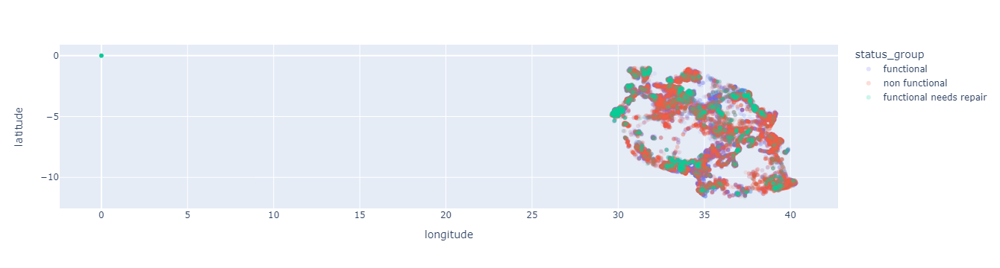

In [7]:
import plotly.express as px
px.scatter(train, x="longitude", y="latitude", color="status_group", opacity=0.1)

In [8]:
train[['longitude','latitude']].describe()

,longitude,latitude
count,47520.000000,4.752000e+04
mean,34.082431,-5.705946e+00
std,6.552053,2.941332e+00
min,0.000000,-1.164944e+01
25%,33.092142,-8.528215e+00
50%,34.910740,-5.021436e+00
75%,37.170578,-3.327185e+00
max,40.344301,-2.000000e-08


##### Définition d'une fonction pour nettoyer et ordonner le train et le val
Nous allons remplacer les latitudes proches de zéro par zéro. Et nous allons par la suite les remplacer par Nan, ce qui facilitera leur imputation.

In [10]:
def nettoyer(X):
    """ Nettoye les jeux de données train et val de la même facon"""
    
    # Pour eviter les avertissements SettingWithCopyWarning
    X = X.copy()
    
    # Toutes les latitudes proches de zéro sont remises à zéro
    X['latitude'] = X['latitude'].replace(-2e-08,0)
    
    # Toutes les latitudes ou longitudes égales à zéro sont remplacés par des Nan
    X['latitude'] = X['latitude'].replace(0, np.nan)
    X['longitude'] = X['longitude'].replace(0,np.nan)
    
    # les colonnes quantity et quantity group sont les mêmes
    X = X.drop(columns='quantity_group')
    
    return X

In [11]:
train = nettoyer(train)
val = nettoyer(val)

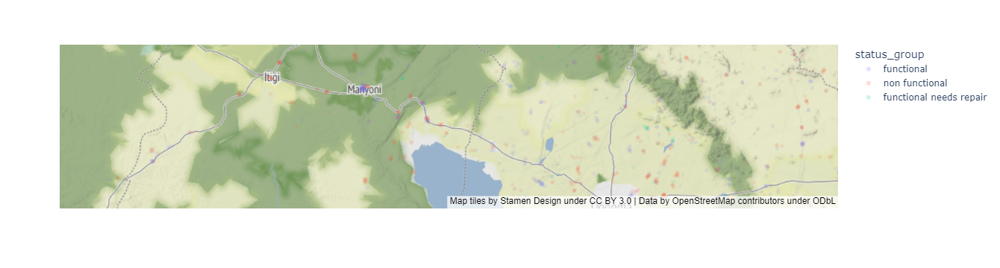

In [13]:
fig = px.scatter_mapbox(train, lat='latitude', lon='longitude', color='status_group', opacity=0.1)
fig.update_layout(mapbox_style='stamen-terrain')
fig.show()

##### Sélection des features

In [15]:
# status_group est notre target
target = 'status_group'

# le jeu train ne doit pas contenir la target. Aussi id est sans effet sur le modèle.
train_features = train.drop(columns=[target,'id'])

# Sélection des features uniquement numériques
numerical_features = train_features.select_dtypes(include='number').columns.tolist()

# Série des features non numériques avec leur cardinalité
cardinality = train_features.select_dtypes(exclude='number').nunique()

# Features non numeriques ayant une cardinalité inférieure à 50
categorical_features = cardinality[cardinality<=50].index.tolist()

features = numerical_features + categorical_features
print(features)

['amount_tsh', 'gps_height', 'longitude', 'latitude', 'num_private', 'region_code', 'district_code', 'population', 'construction_year', 'basin', 'region', 'public_meeting', 'recorded_by', 'scheme_management', 'permit', 'extraction_type', 'extraction_type_group', 'extraction_type_class', 'management', 'management_group', 'payment', 'payment_type', 'water_quality', 'quality_group', 'quantity', 'source', 'source_type', 'source_class', 'waterpoint_type', 'waterpoint_type_group']


In [16]:
X_train = train[features]
y_train = train[target]
X_val = val[features]
y_val = val[target]

#### Scikit-Learn Pipelines

Il existe souvent une séquence fixe d'étapes dans le traitement des données. Un pipeline avec ses méhtodes fit et transform permet d'ajuster toute une séquence d'estimateurs sur les données en une seule fois. On peut aussi effectuer une recherche gridsearch sur les paramètres de tous les estimateurs en une seule fois

In [19]:
from category_encoders import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

decodeur = OneHotEncoder(use_cat_names=True)
imputer = SimpleImputer()
scaler = StandardScaler()
model = LogisticRegression(multi_class='auto',solver='lbfgs',n_jobs=-1)

X_train_decode = decodeur.fit_transform(X_train)
X_train_imputed = imputer.fit_transform(X_train_decode)
X_train_scaled = scaler.fit_transform(X_train_imputed)
model.fit(X_train_scaled, y_train)

X_val_decode = decodeur.transform(X_val)
X_val_imputed = imputer.transform(X_val_decode)
X_val_scaled = scaler.transform(X_val_imputed)
print('Validation accuracy: ',model.score(X_val_scaled, y_val))


Validation accuracy:  0.7308080808080808


Les pipelines permettent d'eviter des erreurs avec un code plus concis.

In [22]:
pipeline = make_pipeline(
    OneHotEncoder(use_cat_names=True),
    SimpleImputer(),
    StandardScaler(),
    LogisticRegression(multi_class='auto', solver='lbfgs', n_jobs=-1))

pipeline.fit(X_train,y_train)

Pipeline(steps=[('onehotencoder',
                 OneHotEncoder(cols=['basin', 'region', 'public_meeting',
                                     'recorded_by', 'scheme_management',
                                     'permit', 'extraction_type',
                                     'extraction_type_group',
                                     'extraction_type_class', 'management',
                                     'management_group', 'payment',
                                     'payment_type', 'water_quality',
                                     'quality_group', 'quantity', 'source',
                                     'source_type', 'source_class',
                                     'waterpoint_type',
                                     'waterpoint_type_group'],
                               use_cat_names=True)),
                ('simpleimputer', SimpleImputer()),
                ('standardscaler', StandardScaler()),
                ('logisticregression', LogisticRegression(n_jobs=-1))])

In [23]:
print('Validation Accuracy: ', pipeline.score(X_val,y_val))

Validation Accuracy:  0.7308080808080808


In [25]:
from sklearn.metrics import accuracy_score
accuracy_score(pipeline.predict(X_val), y_val)

0.7308080808080808

#### Obtenir les coefficients du modèle

Un pipeline n'a pas d'attribut .coef_ mais le modèle qu'il contient en a un. L'attribut named_steps du pipeline retourne un dictionnaire dont les clefs sont les estimateurs -tous écrits en minuscule.

In [28]:
pipeline.named_steps

{'onehotencoder': OneHotEncoder(cols=['basin', 'region', 'public_meeting', 'recorded_by',
                     'scheme_management', 'permit', 'extraction_type',
                     'extraction_type_group', 'extraction_type_class',
                     'management', 'management_group', 'payment', 'payment_type',
                     'water_quality', 'quality_group', 'quantity', 'source',
                     'source_type', 'source_class', 'waterpoint_type',
                     'waterpoint_type_group'],
               use_cat_names=True),
 'simpleimputer': SimpleImputer(),
 'standardscaler': StandardScaler(),
 'logisticregression': LogisticRegression(n_jobs=-1)}

In [38]:
coef = pipeline.named_steps['logisticregression'].coef_
index = pipeline.named_steps['onehotencoder'].transform(X_val).columns
coefficient_table = pd.Series(coef[0], index)
coefficient_table

amount_tsh                               0.042510
gps_height                              -0.060348
longitude                               -0.296331
latitude                                -0.065966
num_private                             -0.005620
                                           ...   
waterpoint_type_group_hand pump          0.030522
waterpoint_type_group_other             -0.097465
waterpoint_type_group_improved spring    0.046804
waterpoint_type_group_cattle trough      0.020486
waterpoint_type_group_dam                0.031648
Length: 180, dtype: float64

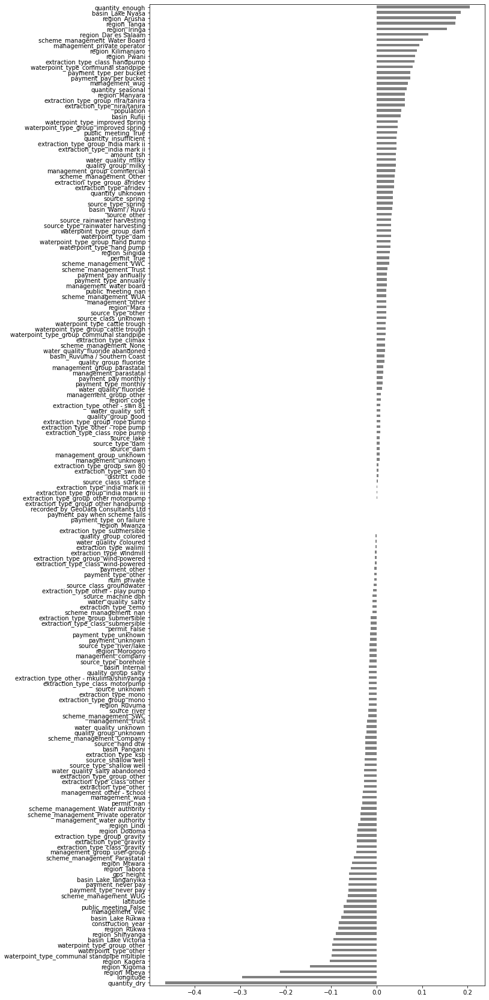

In [42]:
plt.figure(figsize=(10,30))
coefficient_table.sort_values().plot.barh(color='grey');

In [44]:
pipeline.named_steps['onehotencoder'].transform(X_val).describe()

,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year,basin_Lake Nyasa,...,waterpoint_type_communal standpipe multiple,waterpoint_type_improved spring,waterpoint_type_cattle trough,waterpoint_type_dam,waterpoint_type_group_communal standpipe,waterpoint_type_group_hand pump,waterpoint_type_group_other,waterpoint_type_group_improved spring,waterpoint_type_group_cattle trough,waterpoint_type_group_dam
count,11880.000000,11880.000000,11510.000000,11510.000000,11880.000000,11880.000000,11880.000000,11880.000000,11880.000000,11880.000000,...,11880.000000,11880.000000,11880.000000,11880.000000,11880.000000,11880.000000,11880.000000,11880.000000,11880.000000,11880.000000
mean,300.550880,663.215572,35.152217,-5.889816,0.459764,15.451852,5.681734,180.327862,1292.186616,0.085017,...,0.104293,0.012879,0.002273,0.000168,0.587795,0.292340,0.104545,0.012879,0.002273,0.000168
std,2009.467033,693.564505,2.620259,2.827053,6.300048,17.814187,9.683395,503.705815,954.269518,0.278918,...,0.305653,0.112756,0.047621,0.012974,0.492252,0.454857,0.305980,0.112756,0.047621,0.012974
min,0.000000,-90.000000,29.610321,-11.648378,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,33.286573,-8.675837,0.000000,5.000000,2.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,359.000000,34.996972,-5.177011,0.000000,12.000000,3.000000,24.500000,1985.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,20.000000,1316.000000,37.276015,-3.367485,0.000000,17.000000,5.000000,212.250000,2004.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,117000.000000,2627.000000,40.345193,-0.999507,300.000000,99.000000,80.000000,30500.000000,2013.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [45]:
train.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
43360,72938,0.0,2011-07-27,NaN,0,NaN,33.542898,-9.174777,Kwa Mzee Noa,0,...,never pay,soft,good,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe,functional
7263,65358,500.0,2011-03-23,Rc Church,2049,ACRA,34.665760,-9.308548,Kwa Yasinta Ng'Ande,0,...,monthly,soft,good,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
2486,469,25.0,2011-03-07,Donor,290,Do,38.238568,-6.179919,Kwasungwini,0,...,per bucket,salty,salty,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,functional
313,1298,0.0,2011-07-31,Government Of Tanzania,0,DWE,30.716727,-1.289055,Kwajovin 2,0,...,never pay,soft,good,enough,shallow well,shallow well,groundwater,other,other,non functional
52726,27001,0.0,2011-03-10,Water,0,Gove,35.389331,-6.399942,Chama,0,...,per bucket,soft,good,enough,machine dbh,borehole,groundwater,communal standpipe,communal standpipe,functional


In [46]:
train.describe(exclude='number')

,date_recorded,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,...,payment_type,water_quality,quality_group,quantity,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
count,47520,44616,44603,47520,47520,47234,47520,47520,47520,44876,...,47520,47520,47520,47520,47520,47520,47520,47520,47520,47520
unique,349,1716,1929,30661,9,17231,21,124,2082,2,...,7,8,6,5,10,7,3,7,6,3
top,2011-03-17,Government Of Tanzania,DWE,none,Lake Victoria,Shuleni,Iringa,Njombe,Igosi,True,...,never pay,soft,good,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
freq,474,7321,13978,2879,8137,420,4250,2003,257,40838,...,20287,40598,40598,26567,13620,13620,36638,22778,27642,25807


In [51]:
new_pipeline = make_pipeline(
                    OneHotEncoder(use_cat_names=True),
                    SimpleImputer(),
                    StandardScaler()
                             )

In [56]:
data_frame = pd.DataFrame(new_pipeline.fit_transform(X_train), columns=OneHotEncoder(use_cat_names=True).fit_transform(X_train).columns)

In [58]:
data_frame.columns.tolist()

['amount_tsh',
 'gps_height',
 'longitude',
 'latitude',
 'num_private',
 'region_code',
 'district_code',
 'population',
 'construction_year',
 'basin_Lake Nyasa',
 'basin_Rufiji',
 'basin_Wami / Ruvu',
 'basin_Lake Victoria',
 'basin_Internal',
 'basin_Lake Tanganyika',
 'basin_Pangani',
 'basin_Lake Rukwa',
 'basin_Ruvuma / Southern Coast',
 'region_Mbeya',
 'region_Iringa',
 'region_Pwani',
 'region_Kagera',
 'region_Dodoma',
 'region_Rukwa',
 'region_Arusha',
 'region_Mwanza',
 'region_Mtwara',
 'region_Tanga',
 'region_Kilimanjaro',
 'region_Manyara',
 'region_Lindi',
 'region_Kigoma',
 'region_Morogoro',
 'region_Shinyanga',
 'region_Ruvuma',
 'region_Tabora',
 'region_Mara',
 'region_Singida',
 'region_Dar es Salaam',
 'public_meeting_True',
 'public_meeting_False',
 'public_meeting_nan',
 'recorded_by_GeoData Consultants Ltd',
 'scheme_management_VWC',
 'scheme_management_WUA',
 'scheme_management_nan',
 'scheme_management_Water authority',
 'scheme_management_Parastatal',
 's

In [59]:
data_frame[['basin_Lake Nyasa',
 'basin_Rufiji',
 'basin_Wami / Ruvu',
 'basin_Lake Victoria',
 'basin_Internal',
 'basin_Lake Tanganyika',
 'basin_Pangani',
 'basin_Lake Rukwa',
 'basin_Ruvuma / Southern Coast']].head()

,basin_Lake Nyasa,basin_Rufiji,basin_Wami / Ruvu,basin_Lake Victoria,basin_Internal,basin_Lake Tanganyika,basin_Pangani,basin_Lake Rukwa,basin_Ruvuma / Southern Coast
0,3.265172,-0.394942,-0.334151,-0.454546,-0.389334,-0.350306,-0.421643,-0.206861,-0.284186
1,-0.306263,2.532016,-0.334151,-0.454546,-0.389334,-0.350306,-0.421643,-0.206861,-0.284186
2,-0.306263,-0.394942,2.992658,-0.454546,-0.389334,-0.350306,-0.421643,-0.206861,-0.284186
3,-0.306263,-0.394942,-0.334151,2.199998,-0.389334,-0.350306,-0.421643,-0.206861,-0.284186
4,-0.306263,-0.394942,-0.334151,-0.454546,2.568486,-0.350306,-0.421643,-0.206861,-0.284186


In [60]:
X_train[['basin']].head()

,basin
43360,Lake Nyasa
7263,Rufiji
2486,Wami / Ruvu
313,Lake Victoria
52726,Internal


In [64]:
new_pipeline_2 = make_pipeline(
                    OneHotEncoder(use_cat_names=True),
                    SimpleImputer())
data_frame_without_scaling = pd.DataFrame(new_pipeline_2.fit_transform(X_train), columns=OneHotEncoder(use_cat_names=True).fit_transform(X_train).columns)

In [65]:
data_frame_without_scaling[['basin_Lake Nyasa',
 'basin_Rufiji',
 'basin_Wami / Ruvu',
 'basin_Lake Victoria',
 'basin_Internal',
 'basin_Lake Tanganyika',
 'basin_Pangani',
 'basin_Lake Rukwa',
 'basin_Ruvuma / Southern Coast']].head()

,basin_Lake Nyasa,basin_Rufiji,basin_Wami / Ruvu,basin_Lake Victoria,basin_Internal,basin_Lake Tanganyika,basin_Pangani,basin_Lake Rukwa,basin_Ruvuma / Southern Coast
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
